<a href="https://colab.research.google.com/github/UriB1/DL-CycleGAN-Monet2Photo/blob/main/Monet2Photo_Training_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CycleGan - Photo to Monet

**Description:**

Welcome to the training notebook of our CycleGAN project. In this notebook, we'll focus on training and improving our CycleGAN model by repeatedly transforming ordinary photographs into images resembling the style of paintings by the renowned artist Claude Monet, until we reach the best possible result.

**Usage guide:**

* Run setup tasks
* Run data preperation tasks
* Run model tasks
* Run plot tasks
* Run save tasks
* Displayed experiments

**Notes:**
  - The final model is displayed first with:
    - General explanations that applys to all experiments.
    - Full code cells for the training process.
    - Specific explanation about the final models graph.
  - The detailed structure explanation of the final model appears in the test notebook.
  - While scrolling down the notebook you'll see some comments and explanations about the code and the improvment process that concerns all experiments.
  - The actual experiments are shown at the end of the notebook.
    - For each experiment there's a specific explanation in the respective cell.


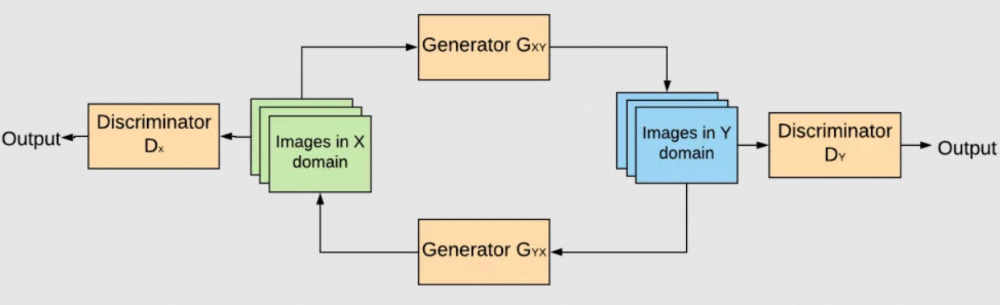

##Imports

Import dependencies

In [ ]:
from google.colab import drive
import os
import tensorflow as tf
import numpy as np
import pandas as pd
import copy
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, Add, UpSampling2D
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.preprocessing.image import smart_resize
from tensorflow.keras.optimizers import Adam
!pip install kaggle

##load from kaggle

* To download the dataset from Kaggle write your Kaggle token credentials below (username + key).  
* Download the dataset with Kaggle API

In [ ]:
os.environ['KAGGLE_USERNAME'] = 'username'
os.environ['KAGGLE_KEY'] = 'key'

if not os.path.exists("/content/gan-getting-started.zip"):
  ! kaggle competitions download -c gan-getting-started
  ! unzip -q gan-getting-started.zip

monet_dir = "/content/monet_jpg"
photo_dir = "/content/photo_jpg"

 95% 347M/367M [00:02<00:00, 233MB/s]
100% 367M/367M [00:02<00:00, 175MB/s]


##Data Processing

- Load the dataset into the training environment
- Split each domain to train and test sets
- Create directories for train and test sets
- Scaling images to a pixle range of [-1, 1]
- Resize images to 320*320
- Normalize pixels
- Load as DataFrame

In [ ]:
monet_files = os.listdir(monet_dir)
photo_files = os.listdir(photo_dir)

monet_train, monet_test = train_test_split(monet_files, test_size=0.8, random_state=42)
photo_train, photo_test = train_test_split(photo_files, test_size=0.5, random_state=42)

train_dir = "/content/train"
test_dir = "/content/test"
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

for filename in monet_train:
    src = os.path.join(monet_dir, filename)
    dst = os.path.join(train_dir, "monet", filename)
    os.makedirs(os.path.dirname(dst), exist_ok=True)
    os.rename(src, dst)

for filename in monet_test:
    src = os.path.join(monet_dir, filename)
    dst = os.path.join(test_dir, "monet", filename)
    os.makedirs(os.path.dirname(dst), exist_ok=True)
    os.rename(src, dst)

for filename in photo_train:
    src = os.path.join(photo_dir, filename)
    dst = os.path.join(train_dir, "photo", filename)
    os.makedirs(os.path.dirname(dst), exist_ok=True)
    os.rename(src, dst)

for filename in photo_test:
    src = os.path.join(photo_dir, filename)
    dst = os.path.join(test_dir, "photo", filename)
    os.makedirs(os.path.dirname(dst), exist_ok=True)
    os.rename(src, dst)

photo_train_dir = "/content/train/photo"
monet_train_dir = "/content/train/monet"
photo_test_dir = "/content/test/photo"
monet_test_dir = "/content/test/monet"

**Split notes:**
  - Splitting action is required to prevent from the same image to apear in the training proccess and in the plot examples (with the trained model).
  - We discoverd that in most cases, the optimal train set size for both domains is about 50 images each, due to computing power and training time.
    - In those cases the Monet test set has 240/300 images (80%), which is allowing us a bigger verity to plot from.
    - In some experiments we gave more images to the train set if the performence of the model was in a good direction. For example, in the final model we ran the training process with 300 images for each domain after we saw good results with 50 images.   

**Train set sample:**

In [ ]:
train_sample_size = 50
target_size = (320, 320)

monet_paths = [os.path.join(monet_train_dir, f) for f in os.listdir(monet_train_dir)[:train_sample_size]]
monet_images = [img_to_array(load_img(path)) for path in monet_paths]
monet_images = [(image / 127.5) - 1 for image in monet_images]
monet_images = [tf.image.resize(image, target_size) for image in monet_images]
monet_df = pd.DataFrame({'image': monet_images})

photo_paths = [os.path.join(photo_train_dir, f) for f in os.listdir(photo_train_dir)[:train_sample_size]]
photo_images = [img_to_array(load_img(path)) for path in photo_paths]
photo_images = [(image / 127.5) - 1 for image in photo_images]
photo_images = [tf.image.resize(image, target_size) for image in photo_images]
photo_df = pd.DataFrame({'image': photo_images})

len(monet_df), len(photo_df)

(50, 50)

**Test set sample:**

In [ ]:
test_sample_size = 240

monet_paths = [os.path.join(monet_test_dir, f) for f in os.listdir(monet_test_dir)[:test_sample_size]]
monet_images = [img_to_array(load_img(path)) for path in monet_paths]
monet_images = [(image / 127.5) - 1 for image in monet_images]
monet_images = [tf.image.resize(image, target_size) for image in monet_images]
test_monet_df = pd.DataFrame({'image': monet_images})

photo_paths = [os.path.join(photo_train_dir, f) for f in os.listdir(photo_train_dir)[:test_sample_size]]
photo_images = [img_to_array(load_img(path)) for path in photo_paths]
photo_images = [(image / 127.5) - 1 for image in photo_images]
photo_images = [tf.image.resize(image, target_size) for image in photo_images]
test_photo_df = pd.DataFrame({'image': photo_images})

len(test_monet_df), len(test_photo_df)

(240, 240)

**Side notes:**

We implemented data augmentation during training to augment the dataset and enhance training diversity. Despite incorporating data augmentation techniques, no significant improvement in results was observed. Consequently, we concluded that data augmentation did not provide tangible benefits and opted not to incorporate it into future experiments.

In [ ]:
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

##**Generator**
###**About The Generator's Structure:**

* Resnet generator refers to generator networks that incorporate residual blocks. ResNet is a type of deep neural network architecture that introduces skip connections or "shortcuts" to overcome the degradation problem encountered in very deep networks.
* Input Shape: The generator takes an input image with a shape of (320, 320, 3), representing a 3-channel image with dimensions 320x320 pixels.

* Encoder: The input image is passed through an encoder module, which consists of convolutional layers. These layers help in extracting hierarchical features from the input image.
  
* Residual Blocks: After the encoder, there are some residual blocks. Residual blocks are used to address the vanishing gradient problem in deep networks and help in learning richer representations.
  * The input to the residual block is added to the output of the second convolutional layer (skip connections).

* Decoder: The decoder module upsamples the feature maps back to the original image dimensions. It consists of transposed convolutional layers followed by a convolutional layer with a tanh activation function.
  * The transposed convolutional layers increase the spatial dimensions of the feature maps while decreasing the number of channels.
* The final convolutional layer produces the output image with three channels (RGB) and applies the tanh activation function to ensure pixel values are in the range of [-1, 1].
   * In some attemps there's a use of sigmoid activation function instead of 'tanh' to make the pixel values in the range of [0, 1] due to the limitations of matplotlib regarding the display of image colors. The results were worse than the ones with the use of 'tanh'.
* Batch normalization and ReLU activation function are applied after each convolutional layer to stabilize the training process.
* Output Shape: The same shape as the Input Shape.



In [ ]:
def Generator(input_shape=(320, 320, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(64, 7, strides=1, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(128, 3, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    for _ in range(12):
        residual = x
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Dropout(0.5)(x)
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Add()([x, residual])

    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(64, 3, strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(3, 7, strides=1, padding='same', activation='tanh')(x)

    return tf.keras.Model(inputs, x)

##**Discriminator**
###**About the discriminator structure:**

* PatchGAN Architecture - The discriminator outputs a single-channel feature map with a size determined by the patch_size parameter. This architecture is known as PatchGAN, where the discriminator classifies whether each patch of the input image is real or fake. This approach helps in capturing local details and textures in the image, making the discriminator more sensitive to fine-grained differences between real and generated images.

* Input Shape: The discriminator takes an input image with a shape of (320, 320, 3), representing a 3-channel image with dimensions 320x320 pixels. This input shape matches the size of the images it will receive during training.

* Convolutional Layers: The discriminator consists of several convolutional layers. These layers help in extracting features from the input images. The use of convolutional layers allows the discriminator to learn spatial patterns and features at different levels of abstraction.

* Leaky ReLU Activation: Leaky ReLU activation functions are used after each convolutional layer. Leaky ReLU allows a small gradient when the unit is not active, which helps prevent the vanishing gradient problem and allows the discriminator to learn more robustly.

* Batch Normalization: Batch normalization layers are added after some of the convolutional layers. Batch normalization helps stabilize the training process by normalizing the activations of each layer, which can improve the speed of convergence and generalization performance.

* Despite the popular approach to use receptive field size of 70x70, in this project we'll use a different receptive field size.

In [ ]:
def Discriminator(input_shape=(320, 320, 3), kernel_size=5):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(64, kernel_size, strides=2, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(128, kernel_size, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(256, kernel_size, strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    outputs = layers.Conv2D(1, 3, strides=1, padding='valid')(x)

    return tf.keras.Model(inputs, outputs)

* Calculate the receptive field size of a discriminator network.
* The receptive field refers to the area in the input image that influences a particular neuron's output in the network.

In [ ]:
discriminator = Discriminator()
input_size = (320, 320, 3)
x = tf.random.normal((1, input_size[0], input_size[1], input_size[2]))
output = discriminator(x)
patch_size = output.shape[1:3]
print("Patch size:", patch_size)

Patch size: (78, 78)


##Loss Functions

Cycle-Consistency Loss - Ensures that an image can be transformed to monet and back again to the original with minimal loss of content.

Discriminator Loss - Discriminator's ability to correctly classify real images as real and generated images as fake.

Generator Loss - Measures how well the generator can fool the discriminator into thinking the generated images are real. A lower generator loss indicates better performance in creating convincing fake images.

Identity Loss - Used to preserve color and composition between the input and output images in tasks where the generator might process images are already Monet.

In [ ]:
def cycle_consistency_loss(real_images, generated_images, lambda_cycle=10):
    loss = tf.reduce_mean(tf.abs(real_images - generated_images))
    return lambda_cycle * loss

def discriminator_loss(real, generated):
    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)
    generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5
ד
def generator_loss(generated):
    return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)


def identity_loss(real_image, same_image, LAMBDA):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

**Loss functions notes while experimenting:**
  - Previous lambda_cycle values (cycle_consistency_loss) were 5, 8, 10, 12, 15.
    - Usually lambda_cycle = 10 gave the best results.
  - Previous LAMBDA values (identity_loss) were 0.2, 0.3, 0.4, 0.5, 0.6, 0.7.
    - Usually LAMBDA = 0.5 gave the best results.
  - Doubling the result in half in the identity loss function helps to strike a balance between encouraging identity preservation and other objectives in the training of CycleGAN models.
  - Scaling down the discriminator loss by 0.5 in the context of adversarial training helps to maintain a balance between the contributions of real and generated samples, encourages effective discrimination, and provides regularization to the training process.  
  - We have tried to use the 'mse' loss function instead of 'BinaryCrossentropy' but our results weren't as good. Below 2 result images from the same model:
    - With mse:

      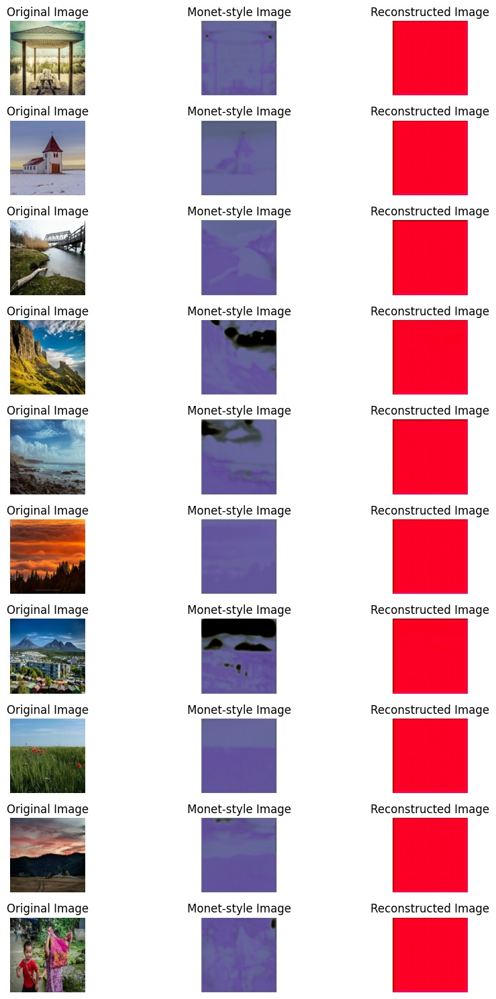

    - Without mse:

      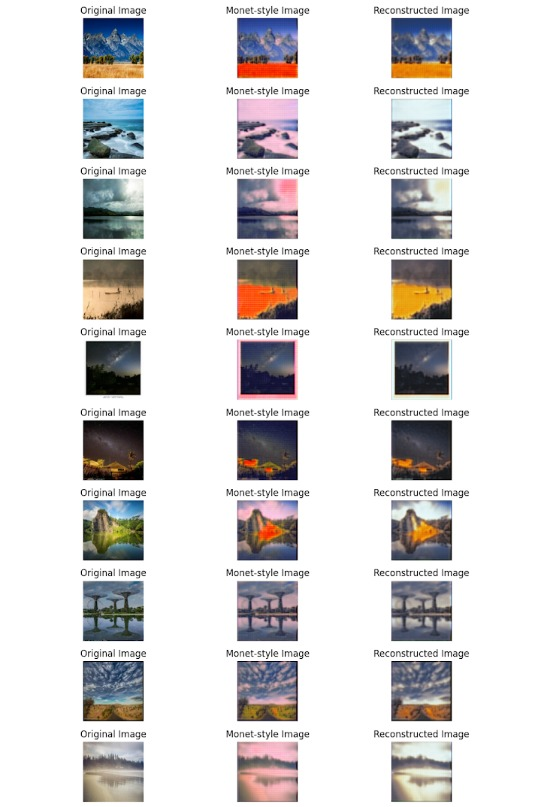

##Training Process



- The training process is executed over a set number of epochs, with a batch size of 1.
- In each batch, real images (photo and monet) are processed to generate fake images, which are then used to compute the discriminator and generator losses.
- The losses:
  - The discriminator loss assessing the ability of discriminators to differentiate between real and fake images.
  - The generator loss encouraging generators to produce images that are classified as real by the discriminators.
  - The cycle-consistency loss ensuring that an image translated from one domain to the other and back again, remains consistent with the original image.
  - The identity loss ensuring that an image from the target domain remains unchanged when processed by the corresponding generator.
- Gradient updates are applied based on these losses to enhance the precision of the generated images and the accuracy of the discriminators.
- In each epoch, the losses values are stored in lists to plot the convergence graph after the training is finished.

**Training key points:**
* Initialize variables + lists
* Define optimizer
* Define training parameters
* Training loop:
  * Sample a batch of real images
  * Train model components
  * Calculate average losses for current epoch
  * Update lowest loss values and save models if applicable
  * Append losses to history lists
  * Print training progress

In [ ]:
lowest_disc_loss_Monet = float('inf')
lowest_disc_loss_photo = float('inf')
lowest_gen_loss_photo2Monet = float('inf')
lowest_gen_loss_Monet2photo = float('inf')

best_discriminator_Monet = None
best_discriminator_photo = None
best_generator_photo2Monet = None
best_generator_Monet2photo = None

epoch_lowest_disc_loss_Monet = 0
epoch_lowest_disc_loss_photo = 0
epoch_lowest_gen_loss_photo2Monet = 0
epoch_lowest_gen_loss_Monet2photo = 0

disc_loss_Monet_history = []
disc_loss_photo_history = []
gen_loss_photo2Monet_history = []
gen_loss_Monet2photo_history = []

generator_photo2Monet = Generator()
generator_Monet2photo = Generator()
discriminator_photo = Discriminator()
discriminator_Monet = Discriminator()

generator_optimizer = Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_optimizer = Adam(learning_rate=2e-4, beta_1=0.5)

generator_optimizer.build(generator_photo2Monet.trainable_variables + generator_Monet2photo.trainable_variables)
discriminator_optimizer.build(discriminator_photo.trainable_variables + discriminator_Monet.trainable_variables)

epochs = 25
batch_size = 1

num_batches = min(len(monet_df), len(photo_df)) // batch_size

for epoch in range(epochs):
    for batch in range(num_batches):
        real_images_monet = np.stack(monet_df.sample(batch_size)['image'].values)
        real_images_photo = np.stack(photo_df.sample(batch_size)['image'].values)

        with tf.GradientTape() as tape:
            fake_images_photo = generator_Monet2photo(real_images_monet, training=True)
            real_output_photo = discriminator_photo(real_images_photo, training=True)
            fake_output_photo = discriminator_photo(fake_images_photo, training=True)
            disc_loss_photo = discriminator_loss(real_output_photo, fake_output_photo)
        gradients_disc_photo = tape.gradient(disc_loss_photo, discriminator_photo.trainable_variables)
        discriminator_optimizer.apply_gradients(zip(gradients_disc_photo, discriminator_photo.trainable_variables))

        with tf.GradientTape() as tape:
            fake_images_monet = generator_photo2Monet(real_images_photo, training=True)
            real_output_Monet = discriminator_Monet(real_images_monet, training=True)
            fake_output_Monet = discriminator_Monet(fake_images_monet, training=True)
            disc_loss_Monet = discriminator_loss(real_output_Monet, fake_output_Monet)
        gradients_disc_Monet = tape.gradient(disc_loss_Monet, discriminator_Monet.trainable_variables)
        discriminator_optimizer.apply_gradients(zip(gradients_disc_Monet, discriminator_Monet.trainable_variables))

        with tf.GradientTape() as tape:
            fake_images_monet = generator_photo2Monet(real_images_photo, training=True)
            fake_output_monet = discriminator_Monet(fake_images_monet, training=True)
            gen_loss_photo2Monet = generator_loss(fake_output_monet)
            cycle_loss_photo2Monet = cycle_consistency_loss(real_images_photo, generator_Monet2photo(fake_images_monet))
            identity_loss_photo2Monet = identity_loss(real_images_monet, generator_photo2Monet(real_images_monet), LAMBDA=0.5)
            total_gen_loss_photo2Monet = gen_loss_photo2Monet + cycle_loss_photo2Monet + identity_loss_photo2Monet
        gradients_gen_photo2Monet = tape.gradient(total_gen_loss_photo2Monet, generator_photo2Monet.trainable_variables)
        generator_optimizer.apply_gradients(zip(gradients_gen_photo2Monet, generator_photo2Monet.trainable_variables))

        with tf.GradientTape() as tape:
            fake_images_photo = generator_Monet2photo(real_images_monet, training=True)
            fake_output_photo = discriminator_photo(fake_images_photo, training=True)
            gen_loss_Monet2photo = generator_loss(fake_output_photo)
            cycle_loss_Monet2photo = cycle_consistency_loss(real_images_monet, generator_photo2Monet(fake_images_photo))
            identity_loss_Monet2photo = identity_loss(real_images_photo, generator_Monet2photo(real_images_photo), LAMBDA=0.5)
            total_gen_loss_Monet2photo = gen_loss_Monet2photo + cycle_loss_Monet2photo + identity_loss_Monet2photo
        gradients_gen_Monet2photo = tape.gradient(total_gen_loss_Monet2photo, generator_Monet2photo.trainable_variables)
        generator_optimizer.apply_gradients(zip(gradients_gen_Monet2photo, generator_Monet2photo.trainable_variables))

    avg_disc_loss_Monet = tf.reduce_mean(disc_loss_Monet).numpy()
    avg_disc_loss_photo = tf.reduce_mean(disc_loss_photo).numpy()
    avg_gen_loss_photo2Monet = tf.reduce_mean(total_gen_loss_photo2Monet).numpy()
    avg_gen_loss_Monet2photo = tf.reduce_mean(total_gen_loss_Monet2photo).numpy()

    if avg_disc_loss_Monet < lowest_disc_loss_Monet:
        lowest_disc_loss_Monet = avg_disc_loss_Monet
        epoch_lowest_disc_loss_Monet = epoch + 1
        best_discriminator_Monet = copy.deepcopy(discriminator_Monet)

    if avg_disc_loss_photo < lowest_disc_loss_photo:
        lowest_disc_loss_photo = avg_disc_loss_photo
        epoch_lowest_disc_loss_photo = epoch + 1
        best_discriminator_photo = copy.deepcopy(discriminator_photo)

    if avg_gen_loss_photo2Monet < lowest_gen_loss_photo2Monet:
        lowest_gen_loss_photo2Monet = avg_gen_loss_photo2Monet
        epoch_lowest_gen_loss_photo2Monet = epoch + 1
        best_generator_photo2Monet = copy.deepcopy(generator_photo2Monet)

    if avg_gen_loss_Monet2photo < lowest_gen_loss_Monet2photo:
        lowest_gen_loss_Monet2photo = avg_gen_loss_Monet2photo
        epoch_lowest_gen_loss_Monet2photo = epoch + 1
        best_generator_Monet2photo = copy.deepcopy(generator_Monet2photo)

    disc_loss_Monet_history.append(tf.reduce_mean(disc_loss_Monet).numpy())
    disc_loss_photo_history.append(tf.reduce_mean(disc_loss_photo).numpy())
    gen_loss_photo2Monet_history.append(tf.reduce_mean(total_gen_loss_photo2Monet).numpy())
    gen_loss_Monet2photo_history.append(tf.reduce_mean(total_gen_loss_Monet2photo).numpy())

    print(f"Epoch {epoch+1}/{epochs}, Batch {num_batches}/{num_batches}")
    print(f"Lowest Disc Loss Monet: {lowest_disc_loss_Monet} at Epoch {epoch_lowest_disc_loss_Monet}")
    print(f"Lowest Disc Loss Photo: {lowest_disc_loss_photo} at Epoch {epoch_lowest_disc_loss_photo}")
    print(f"Lowest Gen Loss Photo2Monet: {lowest_gen_loss_photo2Monet} at Epoch {epoch_lowest_gen_loss_photo2Monet}")
    print(f"Lowest Gen Loss Monet2Photo: {lowest_gen_loss_Monet2photo} at Epoch {epoch_lowest_gen_loss_Monet2photo}")

Epoch 1/25, Batch 300/300
Lowest Disc Loss Monet: 0.7219523787498474 at Epoch 1
Lowest Disc Loss Photo: 0.796235203742981 at Epoch 1
Lowest Gen Loss Photo2Monet: 3.906742811203003 at Epoch 1
Lowest Gen Loss Monet2Photo: 5.324202537536621 at Epoch 1
Epoch 2/25, Batch 300/300
Lowest Disc Loss Monet: 0.37944385409355164 at Epoch 2
Lowest Disc Loss Photo: 0.5857048630714417 at Epoch 2
Lowest Gen Loss Photo2Monet: 3.906742811203003 at Epoch 1
Lowest Gen Loss Monet2Photo: 3.952258825302124 at Epoch 2
Epoch 3/25, Batch 300/300
Lowest Disc Loss Monet: 0.37944385409355164 at Epoch 2
Lowest Disc Loss Photo: 0.501907229423523 at Epoch 3
Lowest Gen Loss Photo2Monet: 3.906742811203003 at Epoch 1
Lowest Gen Loss Monet2Photo: 3.952258825302124 at Epoch 2
Epoch 4/25, Batch 300/300
Lowest Disc Loss Monet: 0.37944385409355164 at Epoch 2
Lowest Disc Loss Photo: 0.501907229423523 at Epoch 3
Lowest Gen Loss Photo2Monet: 3.3063735961914062 at Epoch 4
Lowest Gen Loss Monet2Photo: 3.952258825302124 at Epoch 2

**Training Process Notes While Experimenting:**
  - Different epoch amounts we used were 10, 15, 20, 25 ,30 ,35 ,40 ,45 ,50.
      - 25 was mostly chosen due to duration of running time.   
  - Different learning rates we used were 1e-4, 1e-5, 2e-4, 2e-5.
    - Usually 2e-4 gave the best results.
  - At the beginning of the project we used and saved the weights from the last epoch of the training process but we saw that its not necessarily the best ones to take. Therefore we implemented a saving mechanism for the best weights for each component in the model according to its minimum loss values.
    - The saving mechanizm allowed us to improve the performence of each component and reduce the loss values.
    - By that the results of the model are more realistic then before.
    - Below are 2 images of results from the same model (not the final one) - with and without the saving mechanism:
      - Without the mechanism:

        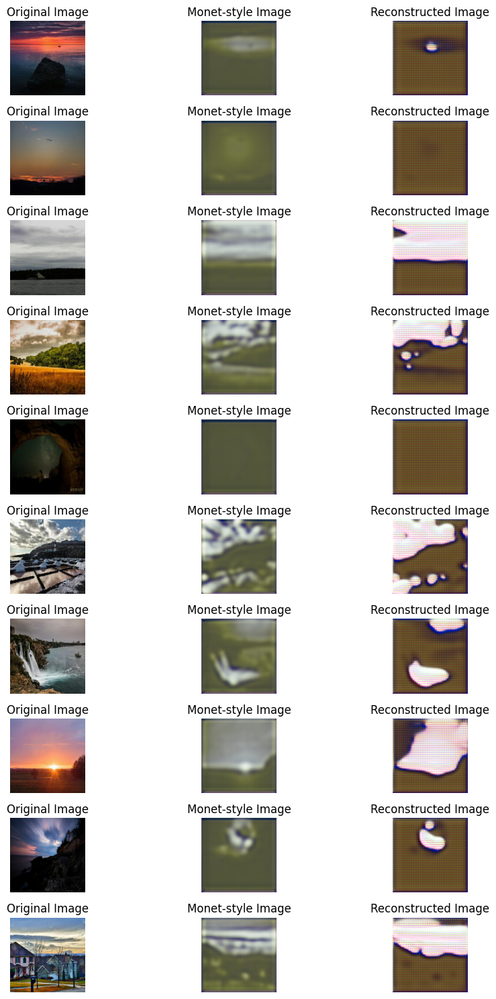

      - With the mechanism:

        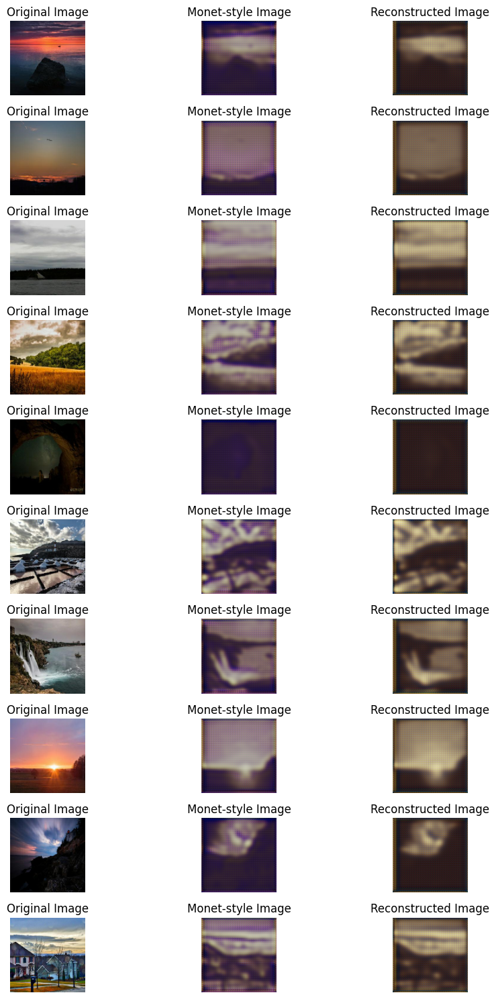

###Convergence Graph
The epochs at which the lowest losses are achieved vary for different components in all models.

Relevant to the final model:

- It can be concluded from the graph below, that for the generators, we reached a minimal loss of:
  - 1.91 at Epoch 22 for photo2Monet generator
  - 2.05 at Epoch 24 for Monet2photo generator

  And for the discriminators, we reached a minimal loss of:
  - 0.18 at Epoch 14 for Monet discriminator
  - 0.28 at Epoch 24 for photo discriminator

- The generator loss for both generators are generally steable through training. Both loss values have generally decreased while training.  
- The discriminator losses for both the Monet and photo domains are pretty similar during the training process, it suggests that the model is learning effectively how to distinguish between real and generated images.

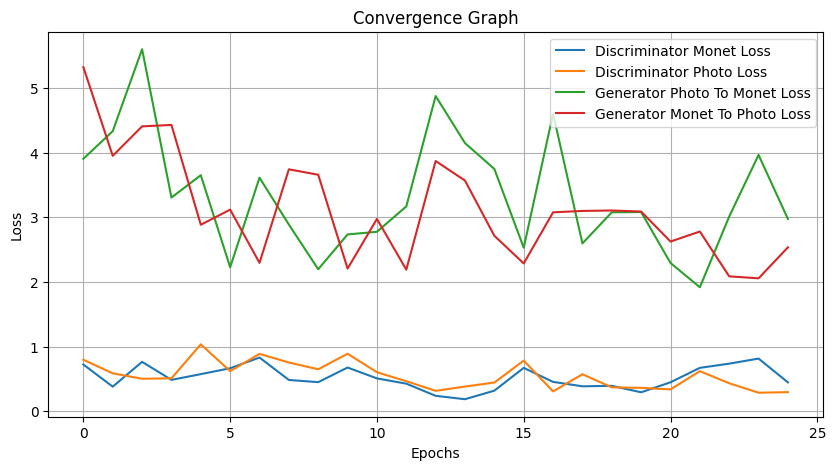

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(range(len(disc_loss_Monet_history)), disc_loss_Monet_history, label='Discriminator Monet Loss')
plt.plot(range(len(disc_loss_photo_history)), disc_loss_photo_history, label='Discriminator Photo Loss')
plt.plot(range(len(gen_loss_photo2Monet_history)), gen_loss_photo2Monet_history, label='Generator Photo To Monet Loss')
plt.plot(range(len(gen_loss_Monet2photo_history)), gen_loss_Monet2photo_history, label='Generator Monet To Photo Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Convergence Graph')
plt.legend()
plt.grid(True)
convergence_plot = plt.gcf()
plt.show()

###Image Sample

* First function to preprocess images for plotting.
  * Rescale images from [-1, 1] to [0, 1] for a better display.
* Second function to generate a new image from any domain to the other


In [ ]:
def preprocess_for_plot(images):
    Rescaled_images = (images + 1) / 2
    return Rescaled_images

def generate_new_images(images, generator):
    generated_images = generator(images, training=False)
    return generated_images

Plot 10 photos as Monet-style images and plot their respective reconstructed images.

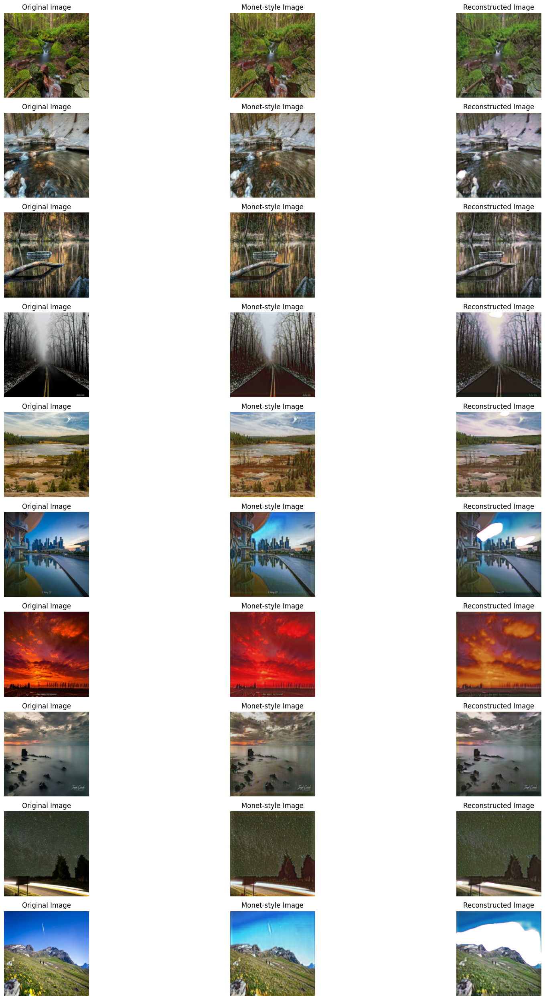

In [ ]:
num_images_to_generate = 10
original_images = np.stack(photo_df.sample(num_images_to_generate)['image'].values)

monet_style_images = generate_new_images(original_images, best_generator_photo2Monet)
recreated_images = generate_new_images(monet_style_images, best_generator_Monet2photo)

original_images = preprocess_for_plot(original_images)
monet_style_images = preprocess_for_plot(monet_style_images)
recreated_images = preprocess_for_plot(recreated_images)

fig, axes = plt.subplots(num_images_to_generate, 3, figsize=(20, 25))
for i in range(num_images_to_generate):
    axes[i, 0].imshow(original_images[i])
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(monet_style_images[i])
    axes[i, 1].set_title("Monet-style Image")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(recreated_images[i])
    axes[i, 2].set_title("Reconstructed Image")
    axes[i, 2].axis("off")

plt.tight_layout()
image_sample_plot = plt.gcf()
plt.show()

## Save Model Components

**The saved items:**
* Model components with minimal loss values.
* Convergence graph.
* Model results.

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

save_path = "/content/drive/MyDrive/my_models/advenced_topics_in_deep_learning"

best_generator_photo2Monet.save(f"{save_path}/generator_photo2Monet_final.keras")
best_generator_Monet2photo.save(f"{save_path}/generator_Monet2photo_final.keras")
best_discriminator_photo.save(f"{save_path}/discriminator_photo_final.keras")
best_discriminator_Monet.save(f"{save_path}/discriminator_Monet_final.keras")

convergence_plot.savefig(f"{save_path}/convergence_graph.png")
image_sample_plot.savefig(f"{save_path}/image_sample.png")

Mounted at /content/drive


## Experiments

In this section, different experiments and architectures are shown from the oldest attempt to the most recent ones.

**Notes:**
  - The best attempt is shown above and not in this section but there's some notes about it in the end.
  - For all experiments, we display the best model weights results and not the version from the last epoch of the training process.
  - In each experiment, mainly the specific details and relevant conclusions for the experiment itself will be described since the general details were presented in the previous sections.  
  - Below we show the most significant changes we had between Dozens of attemps and many adjustments of hyperparameters.

###Ex1


**In the following experiment:**
- A train set size of 300 is set for each domain.
- Loss functions lambda values:
  - For cycle_consistency_loss - the lambda_cycle value is set to 10.
  - For identity_loss - the LAMBDA value is set to 0.5.
- The learning rate is set to 2e-4.
- The number of epochs is set to 25.  

####Generator
Let's break down the structure and functionality of this generator:
- Encoder:
  - Two convolutional layers with 64 and 128 filters respectively are applied successively. Each convolutional layer has a kernel size of 4x4 and a stride of 2, resulting in downsampling of the feature maps.
  - ReLU activation functions are applied to introduce non-linearity.
- Residual Blocks:
  - The residual blocks consist of two convolutional layers with 128 filters each, followed by batch normalization and ReLU activation functions.
  - Six residual blocks are stacked together, as indicated by the loop.
- Decoder:
  - Two convolutional transpose layers with 64 filters each are applied, followed by batch normalization and ReLU activation functions. These layers perform the upsampling operation.
  - A convolutional layer with 3 filters (corresponding to the RGB channels) and a tanh activation function is used to generate the output image. The tanh activation function ensures that the pixel values are in the range [-1, 1], suitable for image data.

This initial generator structure lays a solid foundation for the model to learn meaningful transformations between different image domains. The architecture is designed to balance complexity and effectiveness. Additionally, this structure has been empirically proven effective in many CycleGAN applications, making it a reliable starting point for experimentation and further customization.

In [ ]:
def Generator(input_shape=(320, 320, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    for _ in range(6):
        residual = x
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Add()([x, residual])
        x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(64, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(64, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(3, 4, strides=1, padding='same', activation='tanh')(x)

    return tf.keras.Model(inputs, x)

####Discriminator
Let's break down the structure and functionality of this discriminator:
- The discriminator consists of 4 convolutional layers with 64, 128, 256 and 512 filters respectively, each followed by Leaky ReLU activation functions with a small negative slope (alpha=0.2).
- The convolutional layers use a kernel size of 4x4 and a stride of 2x2, resulting in downsampling of the feature maps. The padding parameter is set to 'same' for the first three convolutional layers to maintain the spatial dimensions, while 'valid' padding is used for the last convolutional layer to adjust the patch size.  
- The 5th and final convolutional layer outputs a single-channel feature map with a kernel size of 5x5 and a stride of 1x1.
- The receptive field size of this discriminator is 33x33.

This initial discriminator structure can effectively learn the mapping between two domains while maintaining visual precision and preserving important image characteristics, and beside the unusual receptive field size, its a pretty basic structure. While larger receptive fields can capture more global context, they may overlook local details. And so, we decided to start with a smaller receptive field size that might capture more local details.




In [ ]:
def Discriminator(input_shape=(320, 320, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(256, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(512, 4, strides=1, padding='valid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    outputs = layers.Conv2D(1, 5, strides=1, padding='valid')(x)

    return tf.keras.Model(inputs, outputs)

In [ ]:
discriminator = Discriminator()
input_size = (320, 320, 3)
x = tf.random.normal((1, input_size[0], input_size[1], input_size[2]))
output = discriminator(x)
patch_size = output.shape[1:3]
print("Receptive field size:", patch_size)

Receptive field size: (33, 33)


####Convergence Graph
- It can be concluded from the graph below, that for the generators, we reached a minimal loss of:
  - 2.43 at Epoch 2 for photo2Monet generator
  - 1.85 at Epoch 2 for Monet2photo generator

  And for the discriminators, we reached a minimal loss of:
  - 0.005 at Epoch 25 for Monet discriminator
  - 0.02 at Epoch 23 for photo discriminator

- The discriminator loss for both the Monet and photo domains generally decreases over epochs, indicating that the discriminators are becoming more effective at distinguishing between real and generated images.
- The generator losses for both generators are increasing over epochs and the difference between them is getting bigger which may suggests that the generators are struggling to produce realistic images, and their performance is deteriorating as training progresses.

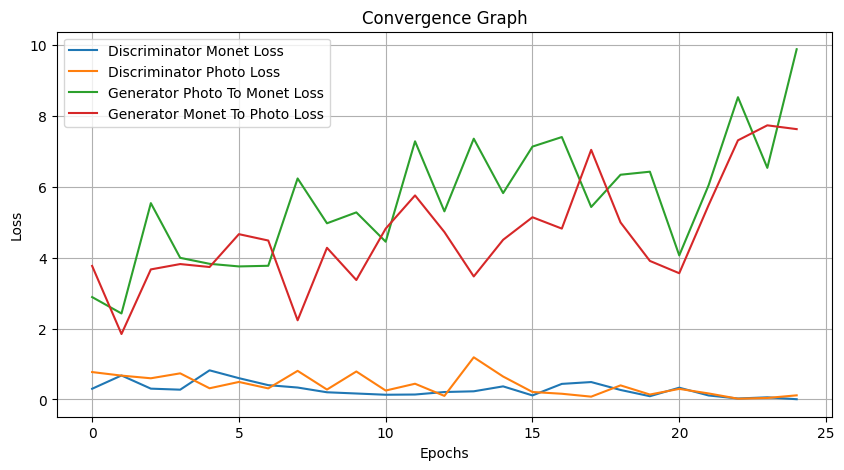

####Image Sample
As we can see from the results, the translation from a photo to a Monet-style image not entirely accurate. In some of the examples there's significant color differences which may harm the accuracy of the translation. Beyond that, when the image is returned to the domain of regular photos, blurring can be noticed in most of the examples.

**The MiFID grade for this model from kaggle is 149.**

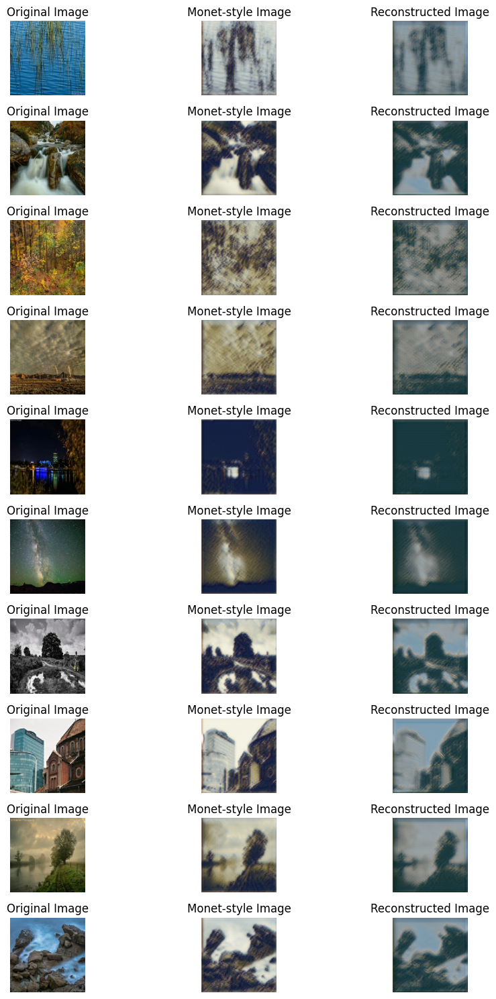

###Ex2

**In the following experiment:**

* A train set size of 50 is set for each domain (instad of 300 like in Ex1).
* Loss functions lambda values:
  * For cycle_consistency_loss - the lambda_cycle value is set to 10.
  * For identity_loss - the LAMBDA value is set to 0.5.
* The learning rate is set to 2e-4.
* The number of epochs is set to 25.  

####Generator
Here are the main changes between the former version of the generator and the current version:

*	Encoder:

  *	The first convolutional layer has 80 filters, while the second has 160 filters instead of 64 and 128.

*	Residual Blocks:

  * There are 2 residual block loops instead of 1 and between the loops there's a convolutional layer with 320 filters.
  *	Each convolutional layer within the first residual block has 160 filters.
  * Each convolutional layer within the second residual block has 320 filters.
  * The second residual block loop stacks 9 blocks.  

*	Decoder:

  *	The first transposed convolutional layer has 160 filters (matching the last layer of the encoder), and the subsequent layers have 80 filters.

*	Output Layer:

  *	The activation function in the former version is Tanh, similar to the current version.

Those changes aims to enhance the model's capacity to capture and generate more complex features, potentially leading to improved performance in image generation tasks.
In addition, our hypothesis was that matching the multiples of the pixels to the size of our image, would lead to better results. Therefore we decided to jump in multiples of 2 from 80 to 160 and to 320 (same number as the 320 pixels image size) and devide it in the same way back to 80.



In [ ]:
def Generator(input_shape=(320, 320, 3)):
  inputs = tf.keras.Input(shape=input_shape)

  x = layers.Conv2D(80, 4, strides=2, padding='same')(inputs)
  x = layers.BatchNormalization()(x)
  x = layers.ReLU()(x)

  x = layers.Conv2D(160 , 4, strides=2, padding='same')(x)
  x = layers.BatchNormalization()(x)
  x = layers.ReLU()(x)

  for _ in range(6):
      residual = x
      x = layers.Conv2D(160 , 3, padding='same')(x)
      x = layers.BatchNormalization()(x)
      x = layers.ReLU()(x)
      x = layers.Conv2D(160 , 3, padding='same')(x)
      x = layers.BatchNormalization()(x)
      x = layers.Add()([x, residual])
      x = layers.ReLU()(x)

  x = layers.Conv2D(320, 4, strides=2, padding='same')(x)
  x = layers.BatchNormalization()(x)
  x = layers.ReLU()(x)

  for _ in range(9):
      residual = x
      x = layers.Conv2D(320, 3, padding='same')(x)
      x = layers.BatchNormalization()(x)
      x = layers.ReLU()(x)
      x = layers.Conv2D(320, 3, padding='same')(x)
      x = layers.BatchNormalization()(x)
      x = layers.Add()([x, residual])
      x = layers.ReLU()(x)

  x = layers.Conv2DTranspose(160 , 4, strides=2, padding='same')(x)
  x = layers.BatchNormalization()(x)
  x = layers.ReLU()(x)
  x = layers.Conv2DTranspose(80, 4, strides=2, padding='same')(x)
  x = layers.BatchNormalization()(x)
  x = layers.ReLU()(x)
  x = layers.Conv2DTranspose(80, 4, strides=2, padding='same')(x)
  x = layers.BatchNormalization()(x)
  x = layers.ReLU()(x)

  x = layers.Conv2DTranspose(3, 4, strides=1, padding='same', activation='tanh')(x)

  return tf.keras.Model(inputs, x)

####Discriminator
Since the convergence graph in the previous experiment showed that both discriminators have low los values, we'll keep the structure as it was. The only change is the amount of filters in each convolutional layer (80, 160, 320, 640) as explained earlier.

In [ ]:
def Discriminator(input_shape=(320, 320, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(80, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(160, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(320, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(640, 4, strides=1, padding='valid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    outputs = layers.Conv2D(1, 5, strides=1, padding='valid')(x)

    return tf.keras.Model(inputs, outputs)

In [ ]:
discriminator = Discriminator()
input_size = (320, 320, 3)
x = tf.random.normal((1, input_size[0], input_size[1], input_size[2]))
output = discriminator(x)
patch_size = output.shape[1:3]
print("Patch size:", patch_size)

Patch size: (33, 33)


Add details about the losses and the training (veriables and more)

####Convergence Graph
- It can be concluded from the graph below, that for the generators, we reached a minimal loss of:
  - 1.4 at Epoch 13 for photo2Monet generator
  - 1.44 at Epoch 14 for Monet2photo generator

  And for the discriminators, we reached a minimal loss of:
  - 0.00056 at Epoch 17 for Monet discriminator
  - 0.00053 at Epoch 23 for photo discriminator

- The discriminator loss for both the Monet and photo domains generally decreases over epochs, indicating that the discriminators are becoming more effective at distinguishing between real and generated images.
- The generator losses for both generators are pretty similar during the training process, it suggests that the model is learning effectively, achieving a balanced representation of both input and output domains, and converging to a stable point in training.

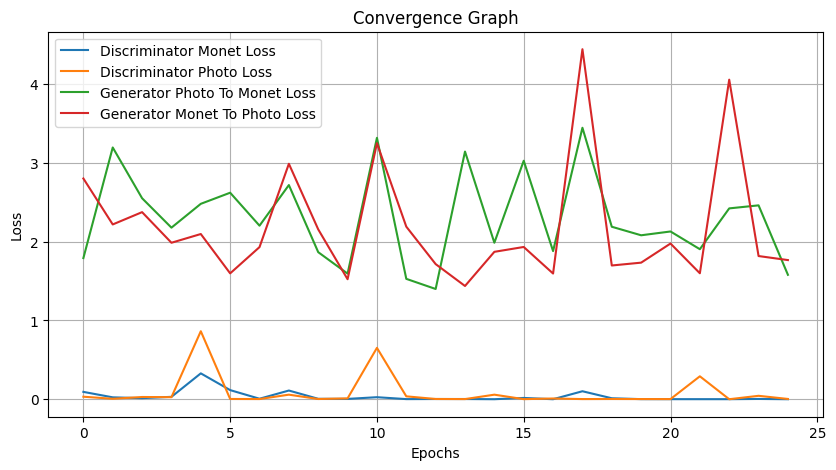

####Image Sample
As shown from the examples below, the model's ability to produce an image has not improved. Now the blurring is much more noticeable than before and the color differences still exist from one translation to another. According to the results, it can be assumed that the changes we made in the model architecture do not help the translation accuracy between the domains, and the hypothesis we made regarding the filter sizes is wrong.

**The MiFID grade for this model from kaggle is 396.**

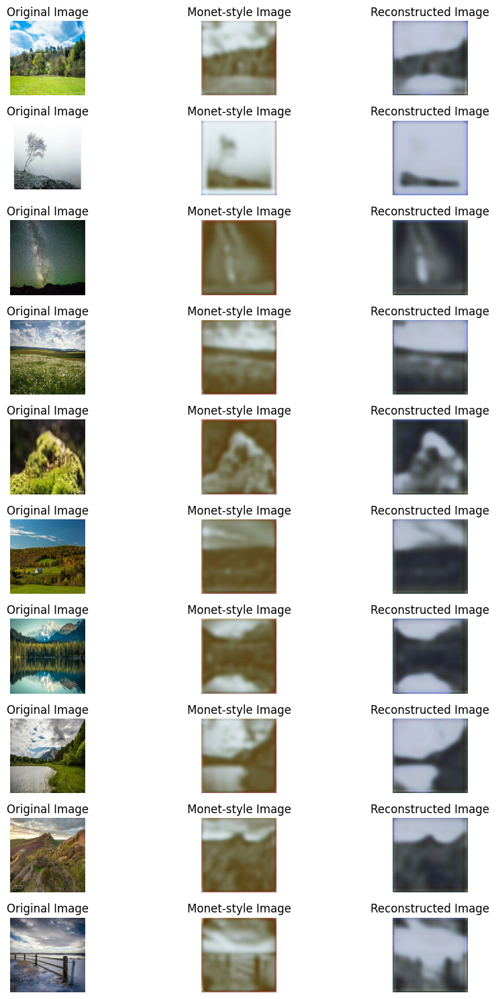

###Ex3

**In the following experiment:**

* A train set size of 50 is set for each domain.
* Loss functions lambda values:
  * For cycle_consistency_loss - the lambda_cycle value is set to 10.
  * For identity_loss - the LAMBDA value is set to 0.5.
* The learning rate is set to 2e-4.
* The number of epochs is set to 25.  

####Generator
Here are the main changes between the former version of the generator and the current version:

* Filter sizes were switched back to what it was in Ex1 in all generator stages.
*	Residual Blocks:
  * There's 1 residual block loop like in Ex1.
  * The residual block loop stacks 9 blocks.  
* Kernal size in the first and last layers is set to 7. The rest of the layers has kernal size of 3.
* Padding is set to 'same' in all layers.
* Strides is set to 1 in the first encoder layer and in the second transposed convolutional layer of the decoder.

Following the fact that in Ex2 we got worse results than Ex1, we decided to go back and try to make the structure of the model more similar to Ex1, with few additional improvements.

In [ ]:
def Generator(input_shape=(320, 320, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(64, 7, strides=1, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(128, 3, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    for _ in range(9):
        residual = x
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Add()([x, residual])
        x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(64, 3, strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(3, 7, strides=1, padding='same', activation='tanh')(x)

    return tf.keras.Model(inputs, x)

####Discriminator
Here are the main changes between the former version of the discriminator and the current version:
* The filters used in convolutional layers are 64, 128, 256, and 512, respectively.
* Padding is set to 'same' for the first three convolutional layers, and 'valid' for the last convolutional layer
* The kernel size for the output layer's is set to 7 instead of 5.
* Due to the changes, the receptive field size is set to 31x31.


In [ ]:
def Discriminator(input_shape=(320, 320, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(256, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(512, 4, strides=1, padding='valid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    outputs = layers.Conv2D(1, 7, strides=1, padding='valid')(x)

    return tf.keras.Model(inputs, outputs)

In [ ]:
discriminator = Discriminator()
input_size = (320, 320, 3)
x = tf.random.normal((1, input_size[0], input_size[1], input_size[2]))
output = discriminator(x)
patch_size = output.shape[1:3]
print("Receptive field size:", patch_size)

Receptive field size: (31, 31)


Add details about the losses and the training (veriables and more)

####Convergence Graph
- It can be concluded from the graph below, that for the generators, we reached a minimal loss of:
  - 2.25 at Epoch 23 for photo2Monet generator
  - 2.17 at Epoch 6 for Monet2photo generator

  And for the discriminators, we reached a minimal loss of:
  - 0.15 at Epoch 17 for Monet discriminator
  - 0.2 at Epoch 21 for photo discriminator

- The generator loss for both generators are generally steable through training. It may show that the moodel achieves a balanced representation of both input and output domains, and converging to a stable point.
- The discriminator losses for both the Monet and photo domains are pretty similar during the training process, it suggests that the model is learning effectively how to distinguish between real and generated images. But it seems that the loss values are increasing over epochs, which may indicate that the discriminators are getting less affective with each epoch.


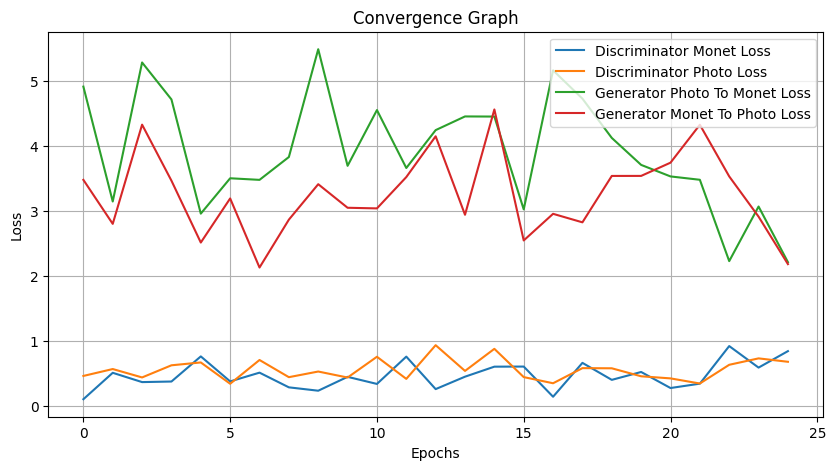

####Image Sample
As shown by the examples below, the model's ability to generate an image has improved, but not in the optimal way. There's still some color differences exist from one translation to another. According to the results, it can be assumed that the changes we made in the model architecture did help the accuracy of the translation between the fields, but further improvement is needed.

**The MiFID grade for this model from kaggle is 100.**

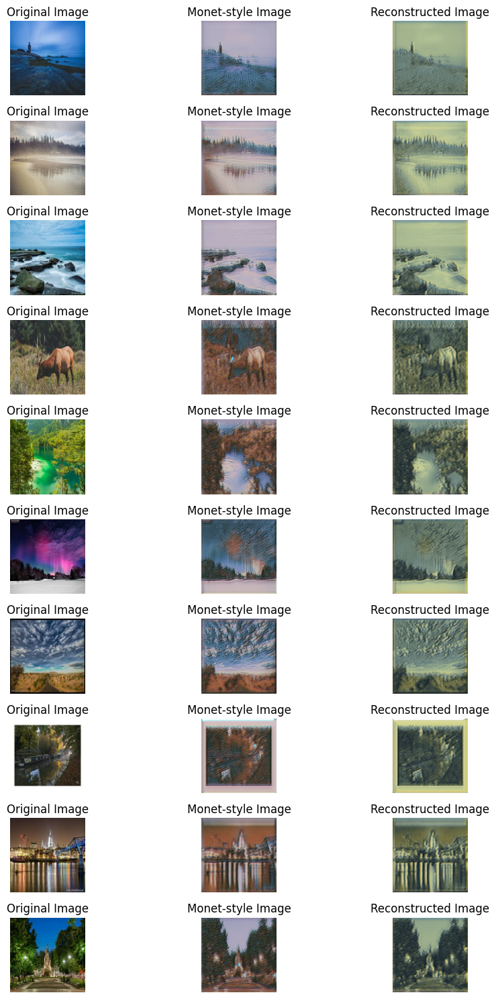

###Ex4

**In the following experiment:**

* A train set size of 50 is set for each domain.
* Loss functions lambda values:
  * For cycle_consistency_loss - the lambda_cycle value is set to 10.
  * For identity_loss - the LAMBDA value is set to 0.5.
* The learning rate is set to 2e-4.
* The number of epochs is set to 25.  

####Generator
Here are the main changes between the former version of the generator and the current version:

* The residual block loop stacks 12 blocks instead of 9 which may lead to improved performance and generalization in the generation task.

In [ ]:
def Generator(input_shape=(320, 320, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(64, 7, strides=1, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(128, 3, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    for _ in range(12):
        residual = x
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Add()([x, residual])
        x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(64, 3, strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(3, 7, strides=1, padding='same', activation='tanh')(x)

    return tf.keras.Model(inputs, x)

####Discriminator
Here are the main changes between the former version of the discriminator and the current version:
- The used filters in the convolutional layers are 64, 128 and 256. The layer with 512 filters has been removed.
- Padding is set to 'same' for the first two convolutional layers, and 'valid' for the last convolutional layer.
- Batch normalization is applied after the second, and third convolutional layers.
- The kernel size for the output layer is set to 5.
- Due to the changes the receptive field size is set to 73x73.

In [ ]:
def Discriminator(input_shape=(320, 320, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(256, 4, strides=1, padding='valid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    outputs = layers.Conv2D(1, 5, strides=1, padding='valid')(x)

    return tf.keras.Model(inputs, outputs)

In [ ]:
discriminator = Discriminator()
input_size = (320, 320, 3)
x = tf.random.normal((1, input_size[0], input_size[1], input_size[2]))
output = discriminator(x)
patch_size = output.shape[1:3]
print("Receptive field size:", patch_size)

Receptive field size: (73, 73)


####Convergence Graph
- It can be concluded from the graph below, that for the generators, we reached a minimal loss of:
  - 1.93 at Epoch 23 for photo2Monet generator
  - 1.94 at Epoch 22 for Monet2photo generator

  And for the discriminators, we reached a minimal loss of:
  - 0.271 at Epoch 6 for Monet discriminator
  - 0.168 at Epoch 2 for photo discriminator

- The generator loss for both generators are generally steable through training. It may show that the model achieves a balanced representation of both input and output domains, and converging to a stable point.
- The discriminator losses for both the Monet and photo domains are pretty similar during the training process, it suggests that the model is learning effectively how to distinguish between real and generated images. But it seems that the loss values are increasing over epochs, which may indicate that the discriminators are getting less affective with each epoch.

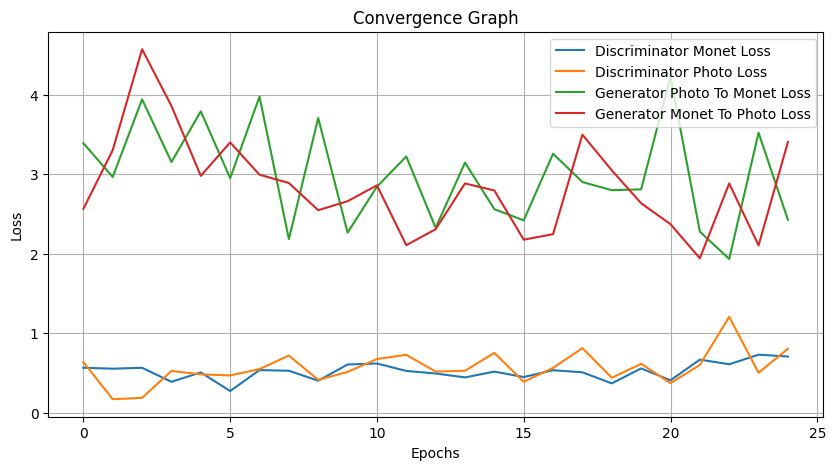

####Image Sample
As shown by the examples below, the model's ability to generate an image has improved again, but there's still a way to go. There's less color differences from one translation to another and the images are less blurry then before. According to the results, it can be assumed that the changes we made in the model architecture did help the accuracy of the translation between the fields, but further improvement is needed. The result seems to have improved since we brought the receptive field size closer to 70 x 70, which was proven to be an ideal size in the cycleGAN model.

**The MiFID grade for this model from kaggle is 82.**

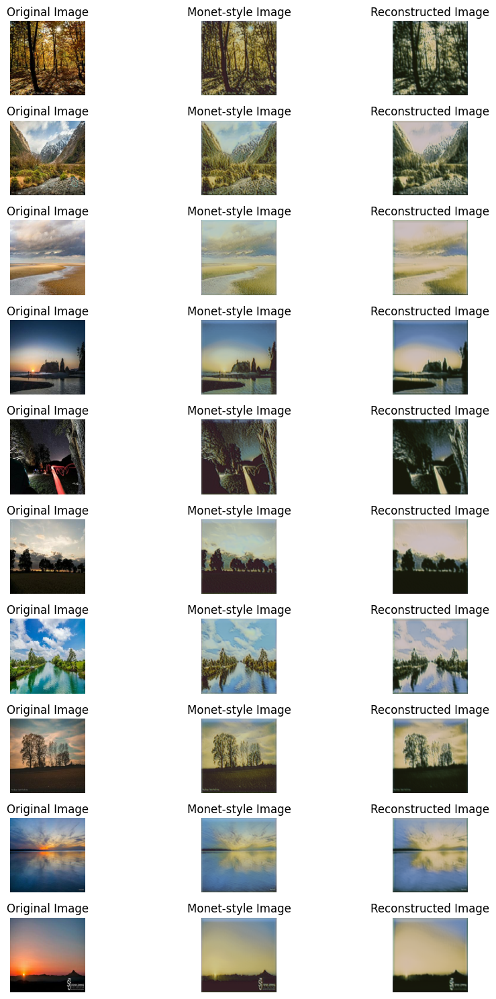

###Ex5

**In the following experiment:**

* A train set size of 300 is set for each domain.
* Loss functions lambda values:
  * For cycle_consistency_loss - the lambda_cycle value is set to 10.
  * For identity_loss - the LAMBDA value is set to 0.5.
* The learning rate is set to 2e-4.
* The number of epochs is set to 25.

####Generator
Here are the main changes between the former version of the generator and the current version:

* There are only 6 residual blocks in the encoder part.
* Added a loop of 2 blocks with transposed convolutional layers to the decoder part.
* Includes dropout layers after each convolution within the residual blocks, both in the encoder and decoder sections. Dropout is applied with a dropout rate of 0.5.

These changes resulted from the desire to try to make the model more robust and generalizable. another reason came from the thought that, it's possible for blocks with transposed convolutional layers in the decoder to improve the quality of the result.

In [ ]:
def Generator(input_shape=(320, 320, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(64, 7, strides=1, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(128, 3, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    for _ in range(6):
        residual = x
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Dropout(0.5)(x)
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Add()([x, residual])

    for _ in range(2):
        residual = x
        x = layers.Conv2DTranspose(128, 3, strides=1, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Dropout(0.5)(x)
        x = layers.Conv2DTranspose(128, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Add()([x, residual])

    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(64, 3, strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(3, 7, strides=1, padding='same', activation='tanh')(x)

    return tf.keras.Model(inputs, x)

####Discriminator
Here are the main changes between the former version of the discriminator and the current version:
- The used filters in the convolutional layers are 64, 128 and 256. The layer with 512 filters has been removed.
- Padding is set to 'same' in all convolutional layers except for the output layer.
- Batch normalization is applied after the first, second, and third convolutional layers.
- The kernel size for the layers is set to 5.
- The kernel size for the output layer is set to 3.
- Due to the changes the receptive field size is set to 78x78.

We wanted to increase the receptive field size due to a hypothesis concerning the relationship between the size of the images inserted into the model and the size of the receptive field.
Usually for 256 x 256 images we will use a 70 x 70 receptive field according to past research. Since we have enlarged the images, it may help us to enlarge the receptive field size as well.

In [ ]:
def Discriminator(input_shape=(320, 320, 3), kernel_size=5):
    inputs = tf.keras.Input(shape=input_shape)

    x = layers.Conv2D(64, kernel_size, strides=2, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(128, kernel_size, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(256, kernel_size, strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    outputs = layers.Conv2D(1, 3, strides=1, padding='valid')(x)

    return tf.keras.Model(inputs, outputs)

In [ ]:
discriminator = Discriminator()
input_size = (320, 320, 3)
x = tf.random.normal((1, input_size[0], input_size[1], input_size[2]))
output = discriminator(x)
patch_size = output.shape[1:3]
print("Patch size:", patch_size)

Patch size: (78, 78)


####Convergence Graph
- It can be concluded from the graph below, that for the generators, we reached a minimal loss of:
  - 2.312 at Epoch 12 for photo2Monet generator
  - 1.774 at Epoch 23 for Monet2photo generator

  And for the discriminators, we reached a minimal loss of:
  - 0.143 at Epoch 24 for Monet discriminator
  - 0.152 at Epoch 24 for photo discriminator

- The discriminator loss for both the Monet and photo domains generally decreases over epochs, indicating that the discriminators are becoming more effective at distinguishing between real and generated images.
- The generator losses for both generators are pretty similar during the training process, it suggests that the model is learning effectively, achieving a balanced representation of both input and output domains, and converging to a stable point in training.

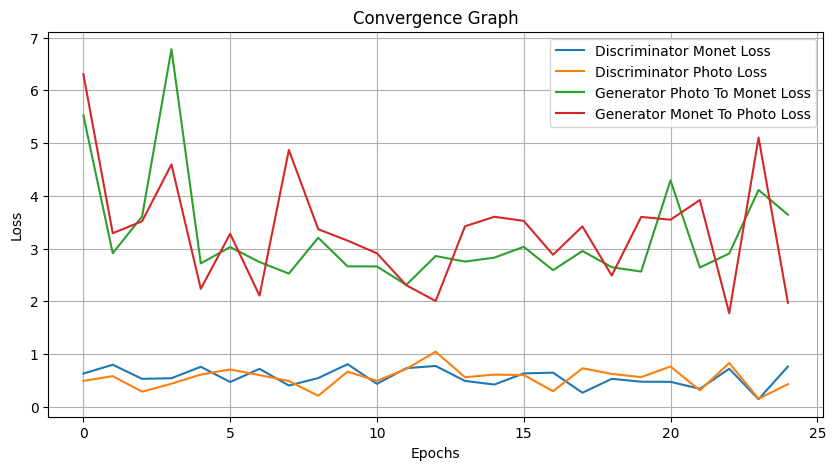

####Image Sample
As shown in the images below, the model's ability to create an image has improved. Apparently, adding the decoder block in the generator helped improve the performance of the model and it's even possible that our hypothesis regarding the size of the receptive field has been confirmed. The colors of the images are closer to each other between image translations and the identification of small details in each image is more accurate then before.

**The MiFID grade for this model from kaggle is 69.**

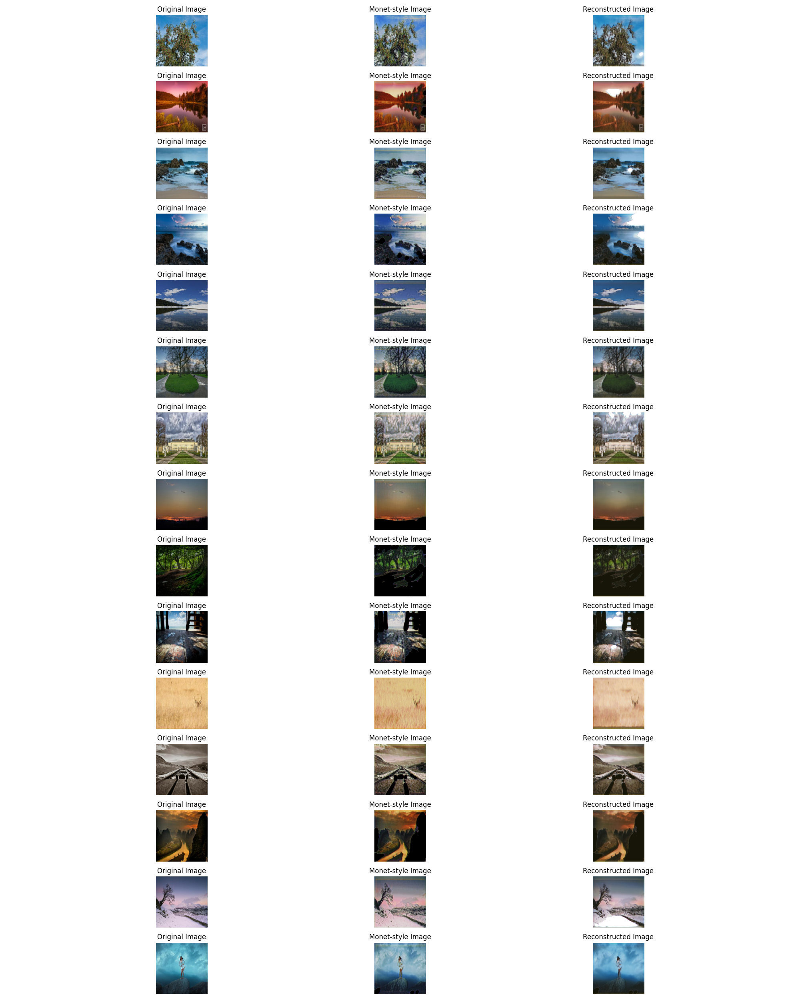

### Notes about the final version:

**In the following experiment:**

* A train set size of 300 is set for each domain.
* Loss functions lambda values:
  * For cycle_consistency_loss - the lambda_cycle value is set to 10.
  * For identity_loss - the LAMBDA value is set to 0.5.
* The learning rate is set to 2e-4.
* The number of epochs is set to 25.

**Here are the main changes between the former version of the generator and the final version:**
  * There are 12 residual blocks in the encoder part.
  * Removed the second loop of residual blocks from the decoder part.
  * Includes dropout layer after the first convolution within the residual blocks. Dropout is applied with a dropout rate of 0.5.

We went back to a generator structure that is similar the the generator from experiment number 4. This change was done since we wanted to check what caused the improvement in the result: the dropout layer or the addition of the transpose layers block to the decoder. In order to do that, we kept the dropout layer but removed the decoder residual block.
In addition, we came to a conclution that the use of a larger number of residual blocks increases the models depth and by so allows it to capture more complex patterns and features in the input images.
We found that this change is also beneficial for generating high-quality images.

**As for the discrimintor, no changes were made.**

**Results:**

By looking at the final versions image sample, this is our best result to date. There are less unwanted color differences from one translation to the other and the images are clearer than before. According to the results, it can be assumed that the changes we made in the model architecture showed us that the improvement in the results happened due to the dropout layer and not  because of the decoder block.

**The MiFID grade for this model from kaggle is 67.**